<a href="https://colab.research.google.com/github/yevenbother/3MinuteThesis/blob/main/bees%20vs%20WASPS_2023.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

In [ ]:
%%capture
!pip install wandb
!apt-get install poppler-utils
!pip install pdf2image
!pip install flashtorch
import requests
from pdf2image import convert_from_path
import matplotlib.pyplot as plt
import numpy as np
import torch
import requests
from torchvision import *
from torchvision.models import *
from flashtorch.utils import apply_transforms
import wandb as wb

In [ ]:
def GPU(data):
    return torch.tensor(data, requires_grad=True, dtype=torch.float, device=torch.device('cuda'))

def GPU_data(data):
    return torch.tensor(data, requires_grad=False, dtype=torch.float, device=torch.device('cuda'))

def plot(x):
    fig, ax = plt.subplots()
    im = ax.imshow(x, cmap = 'gray')
    ax.axis('off')
    fig.set_size_inches(5, 5)
    plt.show()
    
def get_google_slide(url):
    url_head = "https://docs.google.com/presentation/d/"
    url_body = url.split('/')[5]
    page_id = url.split('.')[-1]
    return url_head + url_body + "/export/pdf?id=" + url_body + "&pageid=" + page_id

def get_slides(url):
    url = get_google_slide(url)
    r = requests.get(url, allow_redirects=True)
    open('file.pdf', 'wb').write(r.content)
    images = convert_from_path('file.pdf', 500)
    return images

def load(image):

    return apply_transforms(image).clone().detach().requires_grad_(True).to(device)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load Alexnet

In [ ]:
labels = {int(key):value for (key, value) in requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json').json().items()}
model = alexnet(pretrained=True).to(device)
model.eval();

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 222MB/s]


# Load Images

In [ ]:
url = "https://docs.google.com/presentation/d/1a7k-Hcby1fBCHApUnqzkv_H622P1pYpuLyzCPV-mZPs/edit#slide=id.g1e0d420b0af_1_26"

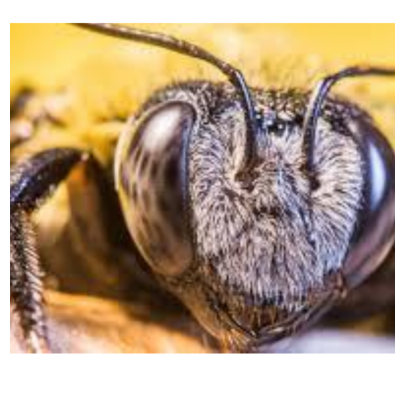

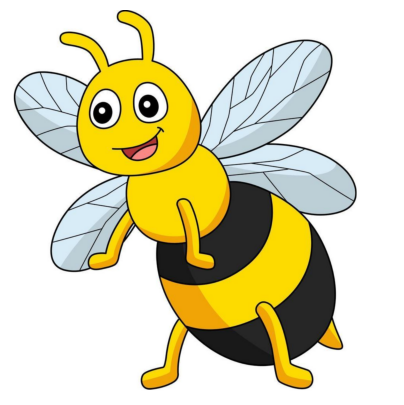

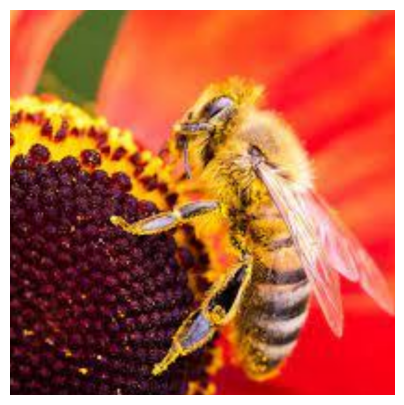

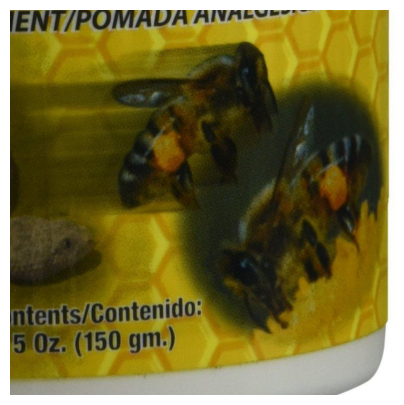

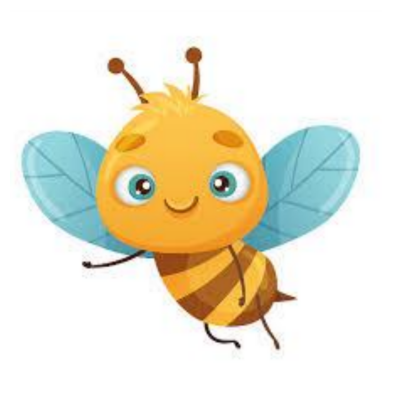

...

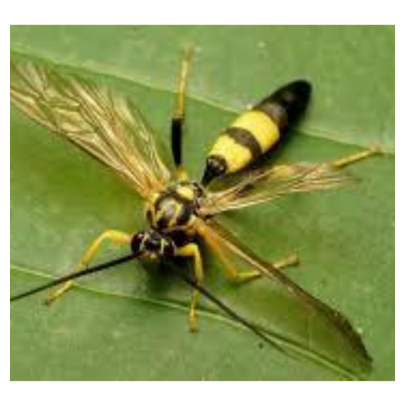

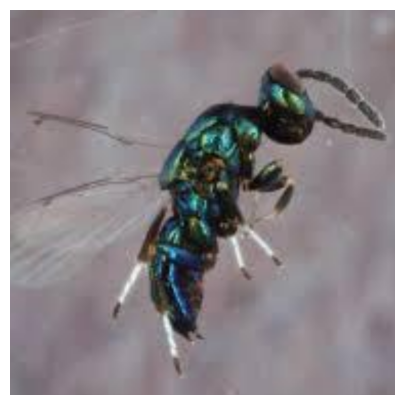

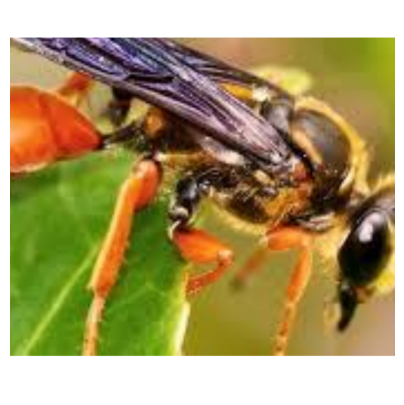

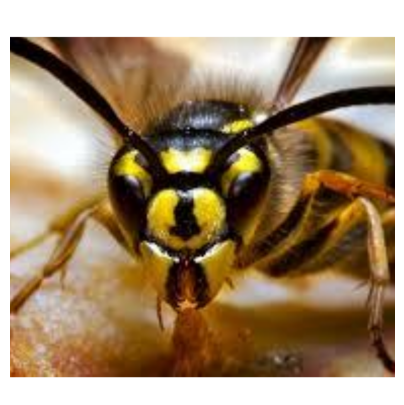

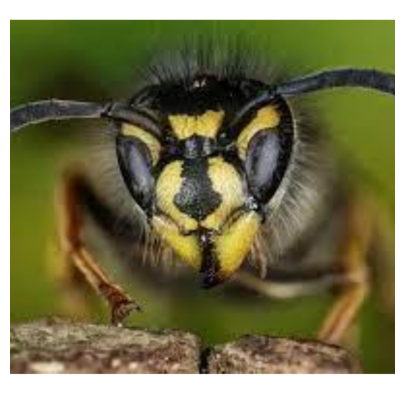

In [ ]:
images = []

for image in get_slides(url):

    plot(image)

    images.append(load(image))

images = torch.vstack(images)

In [ ]:
labels

{0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma 

In [ ]:
images.shape

torch.Size([50, 3, 224, 224])

# Process Image

In [ ]:
y = model(images)

In [ ]:
y.shape   

torch.Size([50, 1000])

In [ ]:
y_out = y.cpu().detach().numpy()

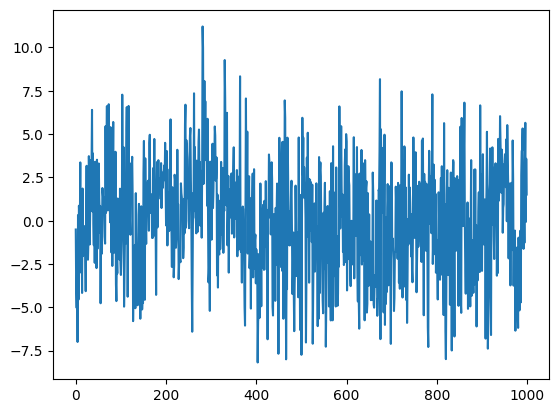

In [ ]:
plt.plot(y_out[0,:])

In [ ]:
guesses = torch.argmax(y, 1).cpu().numpy()

In [ ]:
guesses.shape

(50,)

In [ ]:
guesses

array([281, 917, 309, 599, 719, 309, 309, 309, 309, 599, 309, 599, 309,
       309, 126, 310, 309, 309, 309, 309, 309, 309, 308, 940, 309, 599,
       303, 308, 303, 599, 308,  25, 303,  73, 308, 960, 303,  73, 310,
       307, 319, 599,  74, 319,  74,  72, 300, 316,  72, 303])

In [ ]:
for j,i in enumerate(list(guesses)):
    print(j,i,labels[i])

0 281 tabby, tabby cat
1 917 comic book
2 309 bee
3 599 honeycomb
4 719 piggy bank, penny bank
5 309 bee
6 309 bee
7 309 bee
8 309 bee
9 599 honeycomb
10 309 bee
11 599 honeycomb
12 309 bee
13 309 bee
14 126 isopod
15 310 ant, emmet, pismire
16 309 bee
17 309 bee
18 309 bee
19 309 bee
20 309 bee
21 309 bee
22 308 fly
23 940 spaghetti squash
24 309 bee
25 599 honeycomb
26 303 long-horned beetle, longicorn, longicorn beetle
27 308 fly
28 303 long-horned beetle, longicorn, longicorn beetle
29 599 honeycomb
30 308 fly
31 25 European fire salamander, Salamandra salamandra
32 303 long-horned beetle, longicorn, longicorn beetle
33 73 barn spider, Araneus cavaticus
34 308 fly
35 960 chocolate sauce, chocolate syrup
36 303 long-horned beetle, longicorn, longicorn beetle
37 73 barn spider, Araneus cavaticus
38 310 ant, emmet, pismire
39 307 weevil
40 319 dragonfly, darning needle, devil's darning needle, sewing needle, snake feeder, snake doctor, mosquito hawk, skeeter hawk
41 599 honeycomb
42 7

# Retrain

In [ ]:
Y = np.zeros(50,)
Y[25:] = 1

In [ ]:
Y

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [ ]:
X = y.detach().cpu().numpy() 

In [ ]:
X.shape

(50, 1000)

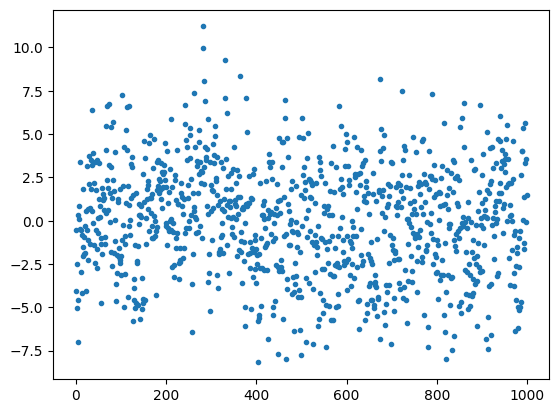

In [ ]:
plt.plot(X[0],'.')

In [ ]:
X[0]

array([-5.09240508e-01, -4.08518171e+00, -5.03345490e+00, -2.50998425e+00,
       -6.99966860e+00,  3.22409630e-01, -4.55479288e+00,  8.63429546e-01,
        9.37065482e-02, -4.71108675e-01,  3.36247253e+00, -2.98343325e+00,
       -5.59710860e-01, -8.08667541e-01, -4.17037344e+00,  1.85533381e+00,
       -2.04739904e+00, -1.53376651e+00, -9.39093590e-01, -1.90140986e+00,
       -3.11290354e-01, -1.85590374e+00, -4.06891632e+00,  5.82320690e-01,
        3.16701841e+00, -5.36967754e-01,  6.82341576e-01, -2.25332904e+00,
       -1.12457871e+00,  3.72358990e+00,  2.09121132e+00, -1.37116480e+00,
        7.49947190e-01,  3.49620533e+00,  1.85643864e+00,  3.19847846e+00,
        6.39432955e+00,  5.31392872e-01,  3.88100410e+00, -1.54860020e-01,
       -1.41471827e+00,  2.16358137e+00, -2.43117714e+00,  3.40090752e+00,
       -5.64848661e-01,  1.77051377e+00, -2.73569679e+00,  3.51799107e+00,
       -1.62807190e+00,  1.80235356e-01, -7.23571181e-01,  3.30131531e+00,
        1.27231979e+00,  

In [ ]:
np.argmax(X[0])

281

In [ ]:
index_winner = np.argmax(X[0])

labels[index_winner]

'tabby, tabby cat'

In [ ]:
top_ten = np.argsort(X[0])[::-1][0:10]

In [ ]:
for i in top_ten:
    print(labels[i])

tabby, tabby cat
tiger cat
wood rabbit, cottontail, cottontail rabbit
three-toed sloth, ai, Bradypus tridactylus
mousetrap
Egyptian cat
ping-pong ball
Brabancon griffon
shopping basket
platypus, duckbill, duckbilled platypus, duck-billed platypus, Ornithorhynchus anatinus


In [ ]:
labels

{0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma 

(array([ 23.,  80., 132., 204., 230., 200.,  91.,  32.,   5.,   3.]),
 array([-8.18283939, -6.24373531, -4.30463123, -2.36552739, -0.42642346,
         1.51268053,  3.45178461,  5.39088869,  7.32999229,  9.26909637,
        11.20820045]),
 <BarContainer object of 10 artists>)

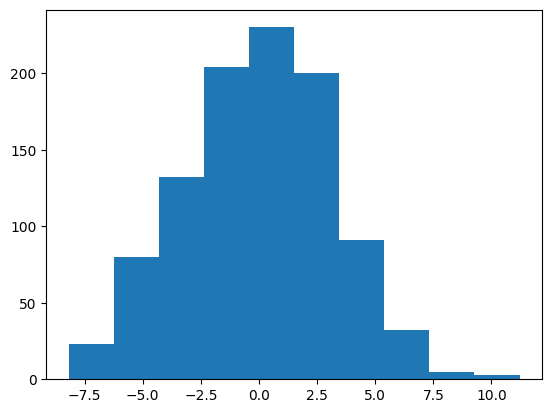

In [ ]:
plt.hist(X[0])

In [ ]:
X = GPU_data(X)
Y = GPU_data(Y)

In [ ]:
X.shape

torch.Size([50, 1000])

In [ ]:
!nvidia-smi

Fri Apr  7 00:48:44 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   67C    P0    31W /  70W |   1727MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
def softmax(x):
    s1 = torch.exp(x - torch.max(x,1)[0][:,None])
    s = s1 / s1.sum(1)[:,None]
    return s

In [ ]:
def cross_entropy(outputs, labels):            
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()])/outputs.size()[0]  

In [ ]:
def randn_trunc(s): #Truncated Normal Random Numbers
    mu = 0 
    sigma = 0.1
    R = stats.truncnorm((-2*sigma - mu) / sigma, (2*sigma - mu) / sigma, loc=mu, scale=sigma)
    return R.rvs(s)

In [ ]:
def Truncated_Normal(size):

    u1 = torch.rand(size)*(1-np.exp(-2)) + np.exp(-2)
    u2 = torch.rand(size)
    z  = torch.sqrt(-2*torch.log(u1)) * torch.cos(2*np.pi*u2)

    return z

In [ ]:
def acc(out,y):
    with torch.no_grad():
        return (torch.sum(torch.max(out,1)[1] == y).item())/y.shape[0]

In [ ]:
X.shape

torch.Size([50, 1000])

In [ ]:
Y.shape

torch.Size([50])

In [ ]:
a = np.array([[1, 2], [3, 4]])

In [ ]:
b = np.array([[5, 6], [1, 0]])

In [ ]:
a.shape,b.shape

((2, 2), (2, 2))

In [ ]:
a@b

array([[ 7,  6],
       [19, 18]])

In [ ]:
def inner_prod(a,b):
    c = 0 
    for i in range(a.shape[0]):
        c += a[i]*b[i]
    return c

In [ ]:
def mat_mult(a,b):

    if a.shape[1] == b.shape[0]:

        c = np.zeros((a.shape[0],b.shape[1]))

        for i in range(a.shape[0]):
            for j in range(b.shape[1]):
               c[i,j] = inner_prod(a[i,:],b[:,j])
        return c
        
    else:
        print("error") 



In [ ]:
%%timeit
a@b

1.6 µs ± 1.01 µs per loop (mean ± std. dev. of 7 runs, 1000000 loops each)


In [ ]:
%%timeit
mat_mult(a,b)

7.66 µs ± 126 ns per loop (mean ± std. dev. of 7 runs, 100000 loops each)


In [ ]:
x = np.random.random((1000,1))

In [ ]:
w = np.random.random((2,1000))

In [ ]:
w.shape,x.shape

((2, 1000), (1000, 1))

In [ ]:
z = mat_mult(w,x)

In [ ]:
z.shape

(2, 1)

In [ ]:
z

array([[246.79442573],
       [243.39094851]])

In [ ]:
def get_batch(mode):
    b = c.b
    if mode == "train":
        r = np.random.randint(X.shape[0]-b) 
        x = X[r:r+b,:]
        y = Y[r:r+b]
    elif mode == "test":
        r = np.random.randint(X_test.shape[0]-b)
        x = X_test[r:r+b,:]
        y = Y_test[r:r+b]
    return x,y

In [ ]:
def model(x,w):

    return x@w[0]

In [ ]:
def make_plots():
    
    acc_train = acc(model(x,w),y)
    
    # xt,yt = get_batch('test')

    # acc_test = acc(model(xt,w),yt)

    wb.log({"acc_train": acc_train})

In [ ]:
wb.init(project="Linear_Model_Photo_1");
c = wb.config

c.h = 0.001
c.b = 32
c.epochs = 100000

w = [GPU(Truncated_Normal((1000,2)))]

optimizer = torch.optim.Adam(w, lr=c.h)  

for i in range(c.epochs):

    x,y = get_batch('train')

    loss = cross_entropy(softmax(model(x,w)),y)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
   
    wb.log({"loss": loss})

    make_plots()


<IPython.core.display.Javascript object>

https://tensorspace.org/